# **🏠 부동산 실거래가 Baseline code**
> 부동산 실거래가 예측 대회에 오신 여러분 환영합니다! 🎉     
> 아래 baseline에서는 RandomForest를 활용해 ML 방법론들을 실제 대회에 적용해보도록 하겠습니다.
> 강의는 google colab으로 실행하였기에 아래의 베이스라인 코드와는 일부 차이가 있을 수 있습니다. 

## Contents
- Library Import
- Data Load
- Data Preprocessing
- Feature Engineering
- Model Training
- Inference
- Output File Save


## 1. Library Import
- 필요한 라이브러리를 불러옵니다.

In [1]:
# !pip install -r requirements.txt

In [1]:
# !pip show eli5

In [2]:
# !pip install --upgrade eli5

In [1]:
# visualization
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import datetime
# fe = fm.FontEntry(
#     fname=r'/usr/share/fonts/truetype/nanum/NanumGothic.ttf', # ttf 파일이 저장되어 있는 경로
#     name='NanumBarunGothic')                        # 이 폰트의 원하는 이름 설정
# fm.fontManager.ttflist.insert(0, fe)              # Matplotlib에 폰트 추가
# plt.rcParams.update({'font.size': 10, 'font.family': 'NanumBarunGothic'}) # 폰트 설정
# plt.rc('font', family='NanumBarunGothic')
import seaborn as sns

# utils
import pandas as pd
import numpy as np
from tqdm import tqdm
import pickle
import warnings;warnings.filterwarnings('ignore')

# Model
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics

# import eli5
# from eli5.sklearn import PermutationImportance

## Data Load

In [2]:
# 필요한 데이터를 load 하겠습니다. 경로는 환경에 맞게 지정해주면 됩니다.
train_path = 'train.csv'
test_path  = 'test.csv'
train = pd.read_csv(train_path)
test = pd.read_csv(test_path)

In [11]:
# rate = pd.read_csv("예금은행대출금리(신규취급액 기준)_주택담보대출.csv")

In [12]:
rate.info()

NameError: name 'rate' is not defined

In [13]:
# rate['date'] = pd.to_datetime(rate['date'])
# concat['계약년월'] = pd.to_datetime(concat['계약년월'])

In [14]:
# def convert_to_yyyymm(date):
#     return date.strftime('%Y%m')


In [15]:
# rate['date_yyyymm'] = rate['date'].apply(convert_to_yyyymm)
# concat['계약년월_new'] = concat['계약년월'].apply(convert_to_yyyymm)

In [16]:
# concat['계약년월_new'].head()

In [17]:
# concat = pd.merge(concat, rate, left_on='계약년월_new', right_on='date_yyyymm', how='left')

In [18]:
# Train data와 Test data shape은 아래와 같습니다.
print('Train data shape : ', train.shape, 'Test data shape : ', test.shape)

Train data shape :  (1118822, 52) Test data shape :  (9272, 51)


In [19]:
train['아파트명']

0          개포6차우성
1          개포6차우성
2          개포6차우성
3          개포6차우성
4          개포6차우성
            ...  
1118817      갈현현대
1118818      갈현현대
1118819      갈현현대
1118820      갈현현대
1118821        묵정
Name: 아파트명, Length: 1118822, dtype: object

## 전처리: 결측치

In [20]:
# train/test 합치기 

train['is_test'] = 0
test['is_test'] = 1
concat = pd.concat([train, test])

In [21]:
# 칼럼별 value_counts 확인 

for col in concat.columns:
    print(col)
    display(concat[col].value_counts())
    
#>> 거래유형, 중개사소재지, 건축면적

시군구


서울특별시 노원구 상계동    45232
서울특별시 노원구 중계동    26524
서울특별시 양천구 신정동    23768
서울특별시 도봉구 창동     23222
서울특별시 구로구 구로동    22941
                 ...  
서울특별시 중구 필동1가        6
서울특별시 용산구 주성동        5
서울특별시 종로구 연지동        4
서울특별시 중구 입정동         3
서울특별시 마포구 구수동        3
Name: 시군구, Length: 339, dtype: int64

번지


13         4670
17         4600
10         4577
347        4291
481        4191
           ... 
792-20        1
752-42        1
8-27          1
90-13         1
1553-15       1
Name: 번지, Length: 6578, dtype: int64

본번


30.0      7105
17.0      5538
13.0      5284
271.0     5015
1.0       4989
          ... 
4974.0       2
1200.0       2
2015.0       2
1486.0       1
2039.0       1
Name: 본번, Length: 1523, dtype: int64

부번


0.0       827096
1.0        95543
2.0        28015
3.0        18100
5.0        14026
           ...  
174.0          2
340.0          2
516.0          1
233.0          1
1507.0         1
Name: 부번, Length: 329, dtype: int64

아파트명


현대               16779
신동아              12929
한신                9128
두산                8593
주공2               7955
                 ...  
제니스뷰                 1
다온숲                  1
포렛빌                  1
DMC금호리첸시아            1
힐스테이트세운센트럴1단지        1
Name: 아파트명, Length: 6549, dtype: int64

전용면적(㎡)


84.9600     20593
84.9700     20093
84.9900     19491
84.9800     19238
59.9400     13974
            ...  
26.7200         1
59.9951         1
104.9880        1
123.0600        1
59.7446         1
Name: 전용면적(㎡), Length: 14670, dtype: int64

계약년월


202006    16364
201503    15510
201808    14990
201707    14922
201705    14766
          ...  
202207      690
202211      646
202209      620
202210      576
201609      460
Name: 계약년월, Length: 201, dtype: int64

계약일


20    40236
15    39519
10    39404
13    38387
18    38217
11    38144
16    38083
25    37615
23    37579
22    37447
9     37444
27    37357
14    37325
12    37082
17    36841
7     36726
8     36655
28    36320
21    36310
19    36251
6     36052
1     36038
4     36029
24    35872
5     35799
26    35510
30    35022
3     34785
2     34758
29    34261
31    21026
Name: 계약일, dtype: int64

층


 5     82748
 4     82633
 3     81089
 2     77575
 6     74215
       ...  
 68        6
 65        6
 67        6
-4         4
 69        2
Name: 층, Length: 73, dtype: int64

건축년도


2004    68919
2003    66039
1999    60262
2000    57250
1988    55953
2005    48648
1998    44325
2001    42574
1997    42531
2002    42174
2008    37540
2006    35168
1992    32792
1996    32341
1993    30694
2007    29929
1995    27218
1994    25902
1987    25781
2009    24260
1989    23829
1986    23494
2010    21178
2011    20480
2014    17433
2012    16555
1990    15800
1991    15336
1983    14293
2013    13559
1982    11800
1984    10671
1980     9820
2015     8965
2016     8558
1978     8128
1985     8097
1979     7069
1981     5225
2019     5195
2018     5106
2017     4869
1974     3444
2020     3084
1976     2665
1971     2407
1977     2329
1975     2187
2021     1951
1973     1049
2022      761
1970      689
1972      685
1969      537
1968      253
1966      105
2023       99
1961       55
1967       17
1965       17
Name: 건축년도, dtype: int64

도로명


올림픽로 435      4372
솔샘로 174       4049
송파대로 345      3668
성북로4길 52      3519
양재대로 1340     3369
              ... 
한강대로62길 18       1
광나루로39길 11       1
 20-3            1
곰달래로 60-1        1
을지로15길 31        1
Name: 도로명, Length: 9245, dtype: int64

해제사유발생일


20220211.0    151
20200727.0     43
20200714.0     40
20200720.0     37
20200715.0     32
             ... 
20230722.0      1
20221119.0      1
20220802.0      1
20220722.0      1
20230909.0      1
Name: 해제사유발생일, Length: 1033, dtype: int64

등기신청일자


            1111271
20230630        585
20230831        496
20230428        394
20230731        374
             ...   
20230105          3
20230125          3
20230109          1
20230102          1
20230104          1
Name: 등기신청일자, Length: 182, dtype: int64

거래유형


-       1086451
중개거래      38123
직거래        3520
Name: 거래유형, dtype: int64

중개사소재지


-                    1090013
서울 노원구                  2627
서울 송파구                  2540
서울 강남구                  2508
서울 강동구                  2038
                      ...   
서울 강북구, 서울 양천구             1
경기 남양주시, 경기 성남수정구          1
서울 송파구, 인천 계양구             1
경기 연천군, 서울 송파구             1
서울 중랑구, 인천 부평구             1
Name: 중개사소재지, Length: 739, dtype: int64

k-단지분류(아파트,주상복합등등)


아파트               238586
주상복합               11450
도시형 생활주택(주상복합)       505
도시형 생활주택(아파트)        155
연립주택                 125
Name: k-단지분류(아파트,주상복합등등), dtype: int64

k-전화번호


024162883      3068
02-575-5024    2816
024046006      2605
025677608      2515
023743863      2385
               ... 
226662806.0       1
29748290.0        1
25147022.0        1
024524500         1
0222099040        1
Name: k-전화번호, Length: 1082, dtype: int64

k-팩스번호


02-572-3212    2816
24162280.0     2470
025613140      2425
29797224.0     2378
25334075.0     2321
               ... 
220689972.0       1
0222099041        1
028130449         1
024524533         1
025861159         1
Name: k-팩스번호, Length: 1385, dtype: int64

단지소개기존clob


4.0       24034
1474.0     2480
638.0      2366
301.0      2119
2315.0     1572
          ...  
2039.0      120
63.0        114
217.0       111
24.0        110
1417.0       52
Name: 단지소개기존clob, Length: 94, dtype: int64

k-세대타입(분양형태)


분양    208098
기타     41638
임대      2233
Name: k-세대타입(분양형태), dtype: int64

k-관리방식


위탁관리    230361
자치관리     18144
직영        3464
Name: k-관리방식, dtype: int64

k-복도유형


계단식    124964
혼합식     85513
복도식     38710
타워형      1371
기타       1082
Name: k-복도유형, dtype: int64

k-난방방식


개별난방    152365
지역난방     84826
중앙난방     12687
기타        2091
Name: k-난방방식, dtype: int64

k-전체동수


10.0     20021
2.0      17300
6.0      16357
3.0      15418
4.0      13336
1.0      12437
7.0      11874
5.0      11864
9.0      10930
8.0      10775
14.0      9892
15.0      9019
11.0      8126
12.0      7802
28.0      7649
13.0      7089
19.0      6635
16.0      4709
22.0      4249
31.0      4009
32.0      3878
23.0      3248
72.0      3068
124.0     2816
30.0      2623
56.0      2605
20.0      2486
33.0      2385
44.0      2366
34.0      2208
17.0      1708
24.0      1705
18.0      1617
51.0      1513
40.0      1504
21.0      1382
50.0      1370
37.0      1028
26.0       823
84.0       549
41.0       514
Name: k-전체동수, dtype: int64

k-전체세대수


5678.0    3068
5040.0    2816
4494.0    2605
4424.0    2592
2433.0    2480
          ... 
494.0        2
514.0        2
614.0        2
243.0        1
1395.0       1
Name: k-전체세대수, Length: 522, dtype: int64

k-건설사(시공사)


삼성물산         14259
대우건설         11549
현대건설         10575
대한주택공사        7665
GS건설          7015
             ...  
두산               5
신영건설             3
자이에스앤디(주)        2
혜림건설             1
삼익건설(주)          1
Name: k-건설사(시공사), Length: 344, dtype: int64

k-시행사


SH공사              12604
대한주택공사             7784
도시개발공사             4284
sh공사               4194
재건축조합              4065
                  ...  
(주)에스떠블유산업개발          2
청명종합건설(주)             2
사당3주택재건축정비사업조합        2
개포우성9차모델링조합           2
한호건설(주)               2
Name: k-시행사, Length: 556, dtype: int64

k-사용검사일-사용승인일


1992-11-18 00:00:00.0    3297
2008-09-30 00:00:00.0    3068
1990-09-06 00:00:00.0    2861
1982-06-04 00:00:00.0    2816
2005-12-28 00:00:00.0    2644
                         ... 
2022-07-28 00:00:00.0       2
2021-12-01 00:00:00.0       2
2023-01-16 00:00:00.0       2
2023-01-27 00:00:00.0       1
1994-12-07 00:00:00.0       1
Name: k-사용검사일-사용승인일, Length: 674, dtype: int64

k-연면적


935380.0    3068
240629.0    2816
667132.0    2605
504698.0    2592
172371.0    2480
            ... 
80835.0        2
44951.0        2
51129.0        2
33807.0        1
60621.0        1
Name: k-연면적, Length: 735, dtype: int64

k-주거전용면적


470140.0    3068
242461.0    2816
537573.0    2605
353089.0    2592
117086.0    2480
            ... 
38716.0        2
24878.0        2
18236.0        2
22782.0        1
37677.0        1
Name: k-주거전용면적, Length: 740, dtype: int64

k-관리비부과면적


618666.0    3068
240629.0    2816
646257.0    2605
470732.0    2592
166985.0    2480
            ... 
50194.0        2
31174.0        2
18237.0        2
22782.0        1
57799.0        1
Name: k-관리비부과면적, Length: 736, dtype: int64

k-전용면적별세대현황(60㎡이하)


0.0       54234
1150.0     3068
370.0      2893
4975.0     2816
750.0      2744
          ...  
543.0         5
438.0         2
614.0         2
9.0           1
1395.0        1
Name: k-전용면적별세대현황(60㎡이하), Length: 349, dtype: int64

k-전용면적별세대현황(60㎡~85㎡이하)


0.0       43342
688.0      3306
4042.0     3068
65.0       2971
1500.0     2605
          ...  
465.0         7
25.0          7
850.0         6
273.0         5
333.0         2
Name: k-전용면적별세대현황(60㎡~85㎡이하), Length: 387, dtype: int64

k-85㎡~135㎡이하


0.0      100377
90.0       3254
486.0      3068
900.0      2605
456.0      2573
          ...  
9.0          38
487.0        22
220.0        15
2.0          12
494.0         2
Name: k-85㎡~135㎡이하, Length: 244, dtype: int64

k-135㎡초과


70.0    329
Name: k-135㎡초과, dtype: int64

k-홈페이지


없음                                                        3628
www.jsls.co.kr                                            3068
gaepo001@naver.com                                        2816
www.oftapt.com                                            2605
성산시영.apt.co.kr                                            2385
                                                          ... 
bbgran.xisad.co.kr                                           7
www. 자양12구역지역재개발조합                                           7
cafe.naver.com                                               6
thesharp-trieh.hthomeservice.com/#/feeManage?_k=vm58ep       2
http://www.i-sh.co.kr/happy/intro.do                         1
Name: k-홈페이지, Length: 221, dtype: int64

k-등록일자


2017-02-01 10:49:21.0    1875
2017-02-10 12:21:22.0     736
2019-01-03 07:03:23.0     549
2017-04-18 02:58:24.0     317
2017-09-06 06:35:46.0     245
                         ... 
2021-11-10 10:27:07.0       2
2021-10-09 20:49:45.0       2
2022-01-05 18:02:23.0       2
2023-03-06 22:40:25.0       2
2023-02-18 07:24:46.0       1
Name: k-등록일자, Length: 127, dtype: int64

k-수정일자


2023-09-20 21:38:55.0    3068
2020-02-17 06:10:24.0    2816
2023-09-20 22:10:18.0    2605
2023-09-23 17:49:17.0    2592
2023-09-25 09:18:00.0    2480
                         ... 
2023-09-25 18:02:22.0       2
2023-09-23 17:23:08.0       2
2023-09-26 04:36:00.0       2
2023-09-23 08:21:37.0       1
2023-09-25 07:49:22.0       1
Name: k-수정일자, Length: 744, dtype: int64

고용보험관리번호


909-01-23103-1    3068
21380014370       2816
908-00-99517-1    2592
907-009-67911     2480
907-00-16928-1    2385
                  ... 
92023031541         28
91919837281         20
918-15-59912-1      15
206-82-61203-0       3
21780016330          1
Name: 고용보험관리번호, Length: 526, dtype: int64

경비비관리형태


위탁       208757
직영        33791
위탁+직영      6168
기타         1817
Name: 경비비관리형태, dtype: int64

세대전기계약방법


종합계약    124610
단일계약    118095
Name: 세대전기계약방법, dtype: int64

청소비관리형태


위탁       227511
직영        15174
위탁+직영      4179
기타         3479
Name: 청소비관리형태, dtype: int64

건축면적


0.00         118394
49266.41       2605
172371.00      2480
25737.00       2366
20457.82       2208
              ...  
6135.89           2
6171.68           2
2724.46           2
6329.59           2
2909.14           1
Name: 건축면적, Length: 455, dtype: int64

주차대수


0.0       18141
2.0        3415
1.0        2864
4245.0     2605
3021.0     2592
          ...  
657.0         2
984.0         2
915.0         2
305.0         2
363.0         1
Name: 주차대수, Length: 526, dtype: int64

기타/의무/임대/임의=1/2/3/4


의무    241849
기타      4186
임의      3701
임대      2233
Name: 기타/의무/임대/임의=1/2/3/4, dtype: int64

단지승인일


2013-06-23 12:47:34.0    3068
2013-06-23 14:21:02.0    2816
2015-01-12 11:06:54.0    2605
2017-04-12 17:26:04.0    2592
2019-01-03 16:13:52.0    2480
                         ... 
2021-12-01 11:18:38.0       2
2022-02-23 13:01:10.0       2
2023-07-21 14:14:45.0       2
2023-04-27 13:23:51.0       1
2016-05-27 17:03:25.0       1
Name: 단지승인일, Length: 736, dtype: int64

사용허가여부


Y    251969
Name: 사용허가여부, dtype: int64

관리비 업로드


N    247788
Y      4181
Name: 관리비 업로드, dtype: int64

좌표X


127.088451    3068
127.058521    2816
127.114376    2605
127.065070    2592
127.066569    2480
              ... 
126.904871       2
127.144876       2
126.996600       2
127.095752       1
127.070158       1
Name: 좌표X, Length: 742, dtype: int64

좌표Y


37.512752    3068
37.480002    2816
37.488521    2605
37.497741    2592
37.642724    2480
             ... 
37.488308       2
37.483848       2
37.564541       2
37.585561       1
37.630117       1
Name: 좌표Y, Length: 742, dtype: int64

단지신청일


2013-03-07 09:46:18.0    16583
2013-03-07 09:46:36.0    11887
2013-03-07 09:46:19.0    11670
2013-03-07 09:46:42.0     7973
2013-03-07 09:46:20.0     7624
                         ...  
2022-12-12 11:52:27.0        2
2021-12-01 11:09:41.0        2
2022-02-23 11:05:05.0        2
2023-07-21 14:11:01.0        2
2023-04-27 13:20:30.0        1
Name: 단지신청일, Length: 260, dtype: int64

target


60000.0     11685
40000.0     10611
30000.0     10046
35000.0      9595
50000.0      9393
            ...  
22175.0         1
131639.0        1
90579.0         1
97414.0         1
20670.0         1
Name: target, Length: 14530, dtype: int64

is_test


0    1118822
1       9272
Name: is_test, dtype: int64

In [22]:
concat['등기신청일자'] = concat['등기신청일자'].replace(' ', np.nan)
concat['거래유형'] = concat['거래유형'].replace('-', np.nan)
concat['중개사소재지'] = concat['중개사소재지'].replace('-', np.nan)

In [23]:
# concat 칼럼별 결측치 비율 

missing_values = concat.isnull().sum()  # 칼럼별 결측치 수 
total_rows = concat.shape[0]  # 전체 행 수 
missing_ratio = (missing_values / total_rows) * 100
missing_ratio_sorted = missing_ratio.sort_values(ascending=False)
missing_ratio_df = pd.DataFrame({'Missing Ratio (%)': missing_ratio_sorted})
missing_ratio_df

,Missing Ratio (%)
k-135㎡초과,99.970836
해제사유발생일,99.450844
k-등록일자,98.962143
등기신청일자,98.508724
중개사소재지,96.624306
거래유형,96.308552
단지소개기존clob,93.871433
k-홈페이지,89.843843
고용보험관리번호,81.620592
세대전기계약방법,78.485392


In [24]:
# 결측치 90% 이상 칼럼 제거 
over_90_na_ratio_col = missing_ratio_df[missing_ratio_df['Missing Ratio (%)'] >= 90].index
concat = concat.drop(columns=over_90_na_ratio_col)

In [25]:
# 불필요해보이는 칼럼 제거 
cols_to_drop = ['k-홈페이지', '고용보험관리번호', 'k-팩스번호', 'k-전화번호' ]
concat = concat.drop(columns=cols_to_drop)

In [26]:
concat[['시군구', '도로명', '번지','본번','부번']]
# 번지: 본번+부번
#>> 주소관련: 시군구, 도로명, 번지 남기고 본번, 부번은 drop 

,시군구,도로명,번지,본번,부번
0,서울특별시 강남구 개포동,언주로 3,658-1,658.0,1.0
1,서울특별시 강남구 개포동,언주로 3,658-1,658.0,1.0
2,서울특별시 강남구 개포동,언주로 3,658-1,658.0,1.0
3,서울특별시 강남구 개포동,언주로 3,658-1,658.0,1.0
4,서울특별시 강남구 개포동,언주로 3,658-1,658.0,1.0
...,...,...,...,...,...
9267,서울특별시 중랑구 신내동,신내역로1길 85,816,816.0,0.0
9268,서울특별시 중랑구 신내동,신내역로1길 85,816,816.0,0.0
9269,서울특별시 중랑구 신내동,신내역로1길 85,816,816.0,0.0
9270,서울특별시 중랑구 신내동,신내역로1길 85,816,816.0,0.0


In [27]:
# 본번, 부번 칼럼 drop 
add_to_drop = ['본번','부번']
concat = concat.drop(columns=add_to_drop)

In [28]:
concat['번지'].nunique()

6578

In [29]:
concat[['k-난방방식', '건축년도']]

,k-난방방식,건축년도
0,개별난방,1987
1,개별난방,1987
2,개별난방,1987
3,개별난방,1987
4,개별난방,1987
...,...,...
9267,개별난방,2014
9268,개별난방,2014
9269,개별난방,2014
9270,개별난방,2014


In [30]:
# 건축년도별 난방방식 비중(난방비중 결측치를 어떻게 채울것인가)
subset = concat[['건축년도', 'k-난방방식']]
grouped = subset.groupby(['건축년도', 'k-난방방식']).size().reset_index(name='count')
pivot = grouped.pivot_table(index='건축년도', columns='k-난방방식', values='count', fill_value=0 )
pivot = pivot.div(pivot.sum(axis=1), axis=0)*100
pivot.round(1)

k-난방방식,개별난방,기타,중앙난방,지역난방
건축년도,,,,
1976,85.4,0.0,0.0,14.6
1978,0.0,0.0,27.1,72.9
1979,0.0,0.0,0.0,100.0
1980,25.1,0.0,0.0,74.9
1981,100.0,0.0,0.0,0.0
1982,90.6,0.0,9.4,0.0
1983,0.0,0.0,0.0,100.0
1984,0.0,0.0,24.6,75.4
1985,100.0,0.0,0.0,0.0


In [31]:
continuous_columns = []
categorical_columns = []

for column in concat.columns:
    if pd.api.types.is_numeric_dtype(concat[column]):
        continuous_columns.append(column)
    else:
        categorical_columns.append(column)

print("연속형 변수:", continuous_columns)
print("\n범주형 변수:", categorical_columns)

연속형 변수: ['전용면적(㎡)', '계약년월', '계약일', '층', '건축년도', 'k-전체동수', 'k-전체세대수', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '건축면적', '주차대수', '좌표X', '좌표Y', 'target', 'is_test']

범주형 변수: ['시군구', '번지', '아파트명', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-수정일자', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드', '단지신청일']


findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font famil

<Axes: >

findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font famil

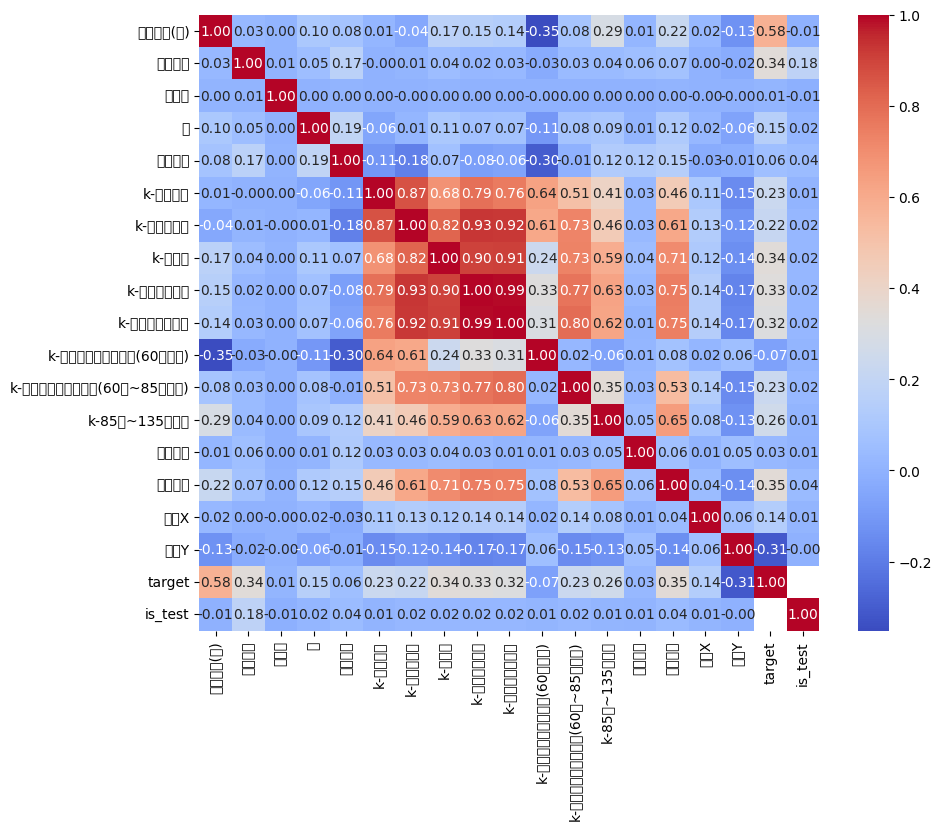

In [32]:
concat_continuous = concat[continuous_columns]
correlation = concat_continuous.corr()

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.figure(figsize=(10,8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")

In [33]:
# corr 높은 칼럼들: k-전체동수, 주차대수, k-전체세대수, k-주거전용면적, k-관리비부과면적, k-전용면적별세대현황(60㎡~85㎡이하), 


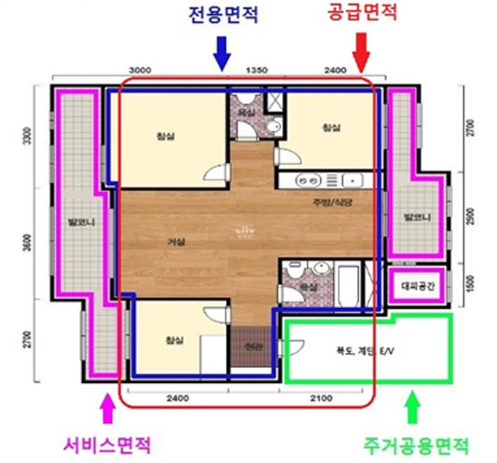

In [34]:
# 면적 관련 칼럼
concat[[ 'k-전체동수', '주차대수', 'k-전체세대수','건축면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-85㎡~135㎡이하', 'k-주거전용면적', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-연면적', '전용면적(㎡)']]
#>> '건축면적': 건물의 1층 바닥 넓이 
#>> '연면적': 건물의 모든 층의 면적을 합한 넓이 

,k-전체동수,주차대수,k-전체세대수,건축면적,k-관리비부과면적,k-전용면적별세대현황(60㎡이하),k-85㎡~135㎡이하,k-주거전용면적,k-전용면적별세대현황(60㎡~85㎡이하),k-연면적,전용면적(㎡)
0,8.0,262.0,270.0,4858.0,22637.0,20.0,0.0,20204.0,250.0,22637.0,79.97
1,8.0,262.0,270.0,4858.0,22637.0,20.0,0.0,20204.0,250.0,22637.0,79.97
2,8.0,262.0,270.0,4858.0,22637.0,20.0,0.0,20204.0,250.0,22637.0,54.98
3,8.0,262.0,270.0,4858.0,22637.0,20.0,0.0,20204.0,250.0,22637.0,79.97
4,8.0,262.0,270.0,4858.0,22637.0,20.0,0.0,20204.0,250.0,22637.0,79.97
...,...,...,...,...,...,...,...,...,...,...,...
9267,16.0,1568.0,1402.0,14171.0,92808.0,808.0,90.0,93849.0,504.0,190866.0,84.65
9268,16.0,1568.0,1402.0,14171.0,92808.0,808.0,90.0,93849.0,504.0,190866.0,84.62
9269,16.0,1568.0,1402.0,14171.0,92808.0,808.0,90.0,93849.0,504.0,190866.0,101.65
9270,16.0,1568.0,1402.0,14171.0,92808.0,808.0,90.0,93849.0,504.0,190866.0,84.94


In [35]:
# 면적 관련 칼럼 drop: 'k-전체세대수', '전용면적(㎡)', 'k-연면적', 'k-전용면적별세대현황(60㎡이하)', 'k-85㎡~135㎡이하', 'k-전용면적별세대현황(60㎡~85㎡이하)'만 남기고 제거 
area_to_drop = ['k-전체동수', '주차대수', '건축면적', 'k-관리비부과면적', 'k-주거전용면적' ]
#>> '건축면적': 건물의 1층 바닥 넓이 ]
concat = concat.drop(columns=area_to_drop)

In [36]:
# 일자 관련 칼럼
concat[['단지신청일', '단지승인일', 'k-사용검사일-사용승인일', 'k-수정일자', '건축년도', '계약일', '계약년월']]
#>> 'k-수정일자': 불필요 
#>> 'k-사용검사일-사용승인일'(결측치 78%): '건축년도'(결측치 0%)로 대체가능 
#>> '단지신청일': '단지승인일'로 대체
#>> '계약일': 불필요 

,단지신청일,단지승인일,k-사용검사일-사용승인일,k-수정일자,건축년도,계약일,계약년월
0,2022-11-17 10:19:06.0,2022-11-17 13:00:29.0,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,1987,8,201712
1,2022-11-17 10:19:06.0,2022-11-17 13:00:29.0,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,1987,22,201712
2,2022-11-17 10:19:06.0,2022-11-17 13:00:29.0,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,1987,28,201712
3,2022-11-17 10:19:06.0,2022-11-17 13:00:29.0,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,1987,3,201801
4,2022-11-17 10:19:06.0,2022-11-17 13:00:29.0,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,1987,8,201801
...,...,...,...,...,...,...,...
9267,2014-09-01 13:05:03.0,2015-09-09 15:30:27.0,2014-06-18 00:00:00.0,2023-09-23 09:00:52.0,2014,19,202307
9268,2014-09-01 13:05:03.0,2015-09-09 15:30:27.0,2014-06-18 00:00:00.0,2023-09-23 09:00:52.0,2014,25,202307
9269,2014-09-01 13:05:03.0,2015-09-09 15:30:27.0,2014-06-18 00:00:00.0,2023-09-23 09:00:52.0,2014,27,202308
9270,2014-09-01 13:05:03.0,2015-09-09 15:30:27.0,2014-06-18 00:00:00.0,2023-09-23 09:00:52.0,2014,2,202309


In [37]:
# 일자 관련 칼럼 drop: 'k-수정일자', 'k-사용검사일-사용승인일', '단지신청일', '계약일' 제거 
date_to_drop = ['k-수정일자', 'k-사용검사일-사용승인일', '단지신청일', '계약일']
concat = concat.drop(columns=date_to_drop)

In [38]:
# 위치 관련 칼럼 
concat[['좌표X', '좌표Y', '시군구', '번지', '도로명']]

,좌표X,좌표Y,시군구,번지,도로명
0,127.05721,37.476763,서울특별시 강남구 개포동,658-1,언주로 3
1,127.05721,37.476763,서울특별시 강남구 개포동,658-1,언주로 3
2,127.05721,37.476763,서울특별시 강남구 개포동,658-1,언주로 3
3,127.05721,37.476763,서울특별시 강남구 개포동,658-1,언주로 3
4,127.05721,37.476763,서울특별시 강남구 개포동,658-1,언주로 3
...,...,...,...,...,...
9267,127.10672,37.618870,서울특별시 중랑구 신내동,816,신내역로1길 85
9268,127.10672,37.618870,서울특별시 중랑구 신내동,816,신내역로1길 85
9269,127.10672,37.618870,서울특별시 중랑구 신내동,816,신내역로1길 85
9270,127.10672,37.618870,서울특별시 중랑구 신내동,816,신내역로1길 85


In [39]:
# 위치 관련 칼럼 drop: '좌표X', '좌표Y' (결측치 78%로 번지, 부번, 본번으로 대체)
location_to_drop = ['좌표X', '좌표Y']
concat = concat.drop(columns=location_to_drop)

In [40]:
concat['시군구'].str.split().str[0].value_counts()
#>> 서울시만 있다 

서울특별시    1128094
Name: 시군구, dtype: int64

In [41]:
# 시군구, 년월 등 분할할 수 있는 변수들은 세부사항 고려를 용이하게 하기 위해 모두 분할해 주겠습니다.
concat['구'] = concat['시군구'].map(lambda x : x.split()[1])
concat['동'] = concat['시군구'].map(lambda x : x.split()[2])
del concat['시군구']

In [42]:
concat.head()

,번지,아파트명,전용면적(㎡),계약년월,층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-세대타입(분양형태),k-관리방식,...,세대전기계약방법,청소비관리형태,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,target,is_test,구,동
0,658-1,개포6차우성,79.97,201712,3,1987,언주로 3,아파트,분양,자치관리,...,단일계약,직영,임의,2022-11-17 13:00:29.0,Y,N,124000.0,0,강남구,개포동
1,658-1,개포6차우성,79.97,201712,4,1987,언주로 3,아파트,분양,자치관리,...,단일계약,직영,임의,2022-11-17 13:00:29.0,Y,N,123500.0,0,강남구,개포동
2,658-1,개포6차우성,54.98,201712,5,1987,언주로 3,아파트,분양,자치관리,...,단일계약,직영,임의,2022-11-17 13:00:29.0,Y,N,91500.0,0,강남구,개포동
3,658-1,개포6차우성,79.97,201801,4,1987,언주로 3,아파트,분양,자치관리,...,단일계약,직영,임의,2022-11-17 13:00:29.0,Y,N,130000.0,0,강남구,개포동
4,658-1,개포6차우성,79.97,201801,2,1987,언주로 3,아파트,분양,자치관리,...,단일계약,직영,임의,2022-11-17 13:00:29.0,Y,N,117000.0,0,강남구,개포동


In [43]:
pd.set_option('display.max_rows', 100)
concat[['k-관리방식', 'k-전체세대수','전용면적(㎡)',  '아파트명']]

,k-관리방식,k-전체세대수,전용면적(㎡),아파트명
0,자치관리,270.0,79.97,개포6차우성
1,자치관리,270.0,79.97,개포6차우성
2,자치관리,270.0,54.98,개포6차우성
3,자치관리,270.0,79.97,개포6차우성
4,자치관리,270.0,79.97,개포6차우성
...,...,...,...,...
9267,위탁관리,1402.0,84.65,신내우디안1단지
9268,위탁관리,1402.0,84.62,신내우디안1단지
9269,위탁관리,1402.0,101.65,신내우디안1단지
9270,위탁관리,1402.0,84.94,신내우디안1단지


In [44]:
concat['아파트명'].nunique()
#>> 아파트명 6,549개 

6549

In [45]:
print(concat['구'].nunique())
print(concat['동'].nunique())
print(concat['전용면적(㎡)'].nunique())

25
337
14670


In [46]:
# # 이상치 제거 방법에는 IQR을 이용하겠습니다.
# def remove_outliers_iqr(dt, column_name):
#     df = dt.query('is_test == 0')       # train data 내에 있는 이상치만 제거하도록 하겠습니다.
#     df_test = dt.query('is_test == 1')

#     Q1 = df[column_name].quantile(0.25)
#     Q3 = df[column_name].quantile(0.75)
#     IQR = Q3 - Q1

#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     df = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

#     result = pd.concat([df, df_test])   # test data와 다시 합쳐주겠습니다.
#     return result

In [47]:
# # 위 방법으로 전용 면적에 대한 이상치를 제거해보겠습니다.
# concat = remove_outliers_iqr(concat, '전용면적(㎡)')

In [48]:
# 먼저, 연속형 변수와 범주형 변수를 위 info에 따라 분리해주겠습니다.
continuous_columns = []
categorical_columns = []

for column in concat.columns:
    if pd.api.types.is_numeric_dtype(concat[column]):
        continuous_columns.append(column)
    else:
        categorical_columns.append(column)

print("연속형 변수:", continuous_columns)
print("범주형 변수:", categorical_columns)

연속형 변수: ['전용면적(㎡)', '계약년월', '층', '건축년도', 'k-전체세대수', 'k-연면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'target', 'is_test']
범주형 변수: ['번지', '아파트명', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-건설사(시공사)', 'k-시행사', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드', '구', '동']


In [49]:
# # 범주형 변수에 대한 보간
# concat[categorical_columns] = concat[categorical_columns].fillna('NULL')

# # 연속형 변수에 대한 보간 (선형 보간)
# concat[continuous_columns] = concat[continuous_columns].interpolate(method='linear', axis=0)

In [50]:
concat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1128094 entries, 0 to 9271
Data columns (total 30 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   번지                      1127867 non-null  object 
 1   아파트명                    1125958 non-null  object 
 2   전용면적(㎡)                 1128094 non-null  float64
 3   계약년월                    1128094 non-null  int64  
 4   층                       1128094 non-null  int64  
 5   건축년도                    1128094 non-null  int64  
 6   도로명                     1128094 non-null  object 
 7   k-단지분류(아파트,주상복합등등)      250821 non-null   object 
 8   k-세대타입(분양형태)            251969 non-null   object 
 9   k-관리방식                  251969 non-null   object 
 10  k-복도유형                  251640 non-null   object 
 11  k-난방방식                  251969 non-null   object 
 12  k-전체세대수                 251969 non-null   float64
 13  k-건설사(시공사)              250457 non-null   object 
 14  k-시행사

# Model Training

In [51]:
# 이제 다시 train과 test dataset을 분할해줍니다. 위에서 제작해 놓았던 is_test 칼럼을 이용합니다.
concat['계약년월'] = concat['계약년월'].astype(int)
dt_train = concat.query('is_test==0 and 계약년월 >= 202101')
dt_test = concat.query('is_test==1')



# 이제 is_test 칼럼은 drop해줍니다.
dt_train.drop(['is_test'], axis = 1, inplace=True)
dt_test.drop(['is_test'], axis = 1, inplace=True)
print(dt_train.shape, dt_test.shape)

(72879, 29) (9272, 29)


In [52]:
# dt_test의 target은 일단 0으로 임의로 채워주도록 하겠습니다.
dt_test['target'] = 0

In [53]:
# 파생변수 제작으로 추가된 변수들이 존재하기에, 다시한번 연속형과 범주형 칼럼을 분리해주겠습니다.
continuous_columns_v2 = []
categorical_columns_v2 = []

for column in dt_train.columns:
    if pd.api.types.is_numeric_dtype(dt_train[column]):
        continuous_columns_v2.append(column)
    else:
        categorical_columns_v2.append(column)

print("연속형 변수:", continuous_columns_v2)
print("범주형 변수:", categorical_columns_v2)

연속형 변수: ['전용면적(㎡)', '계약년월', '층', '건축년도', 'k-전체세대수', 'k-연면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'target']
범주형 변수: ['번지', '아파트명', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-건설사(시공사)', 'k-시행사', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드', '구', '동']


In [54]:
# 아래에서 범주형 변수들을 대상으로 레이블인코딩을 진행해 주겠습니다.

# 각 변수에 대한 LabelEncoder를 저장할 딕셔너리
label_encoders = {}

# Implement Label Encoding
for col in tqdm(categorical_columns_v2):
    lbl = LabelEncoder()

    # Label-Encoding을 fit
    lbl.fit(dt_train[col].astype(str))
    dt_train[col] = lbl.transform(dt_train[col].astype(str))
    label_encoders[col] = lbl  # 나중에 후처리를 위해 레이블인코더를 저장해주겠습니다.

    # Test 데이터에만 존재하는 새로 출현한 데이터를 신규 클래스로 추가해줍니다.
    unique_labels_test = pd.unique(dt_test[col])
    for label in unique_labels_test:
        if not isinstance(label, str):  # 숫자인 경우 문자열로 변환
            label = str(label)
        if label not in lbl.classes_:  # unseen label 데이터인 경우
            lbl.classes_ = np.append(lbl.classes_, label)  # 미처리 시 ValueError발생하니 주의하세요!

    dt_test[col] = lbl.transform(dt_test[col].astype(str))


100%|██████████| 19/19 [00:01<00:00, 18.14it/s]


In [55]:
assert dt_train.shape[1] == dt_test.shape[1]          # train/test dataset의 shape이 같은지 확인해주겠습니다.

In [56]:
# Target과 독립변수들을 분리해줍니다.
y_train = dt_train['target']
X_train = dt_train.drop(['target'], axis=1)

# Hold out split을 사용해 학습 데이터와 검증 데이터를 8:2 비율로 나누겠습니다.
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=2023)

In [57]:
# GridSearch CV 
from sklearn.model_selection import GridSearchCV, KFold
from catboost import CatBoostRegressor

param_grid = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.05, 0.1, 0.15],
    'depth': [4, 6, 8],
    'l2_leaf_reg': [1, 3, 5],
    'random_strength': [0.5, 1, 1.5]
}

# k-fold 교차 검증
kf = KFold(n_splits=5, shuffle=True, random_state=2023)

best_score = None
best_params = None

# GridSearchCV를 사용하여 하이퍼파라미터 튜닝 및 k-fold 교차 검증
model = CatBoostRegressor(random_seed=1)
grid_search = GridSearchCV(estimator=model,
                           param_grid=param_grid,
                           cv=kf,
                           n_jobs=-1,
                           verbose=2)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터 출력
print("Best parameters found: ", grid_search.best_params_)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits


0:	learn: 76417.4254037	total: 48.2ms	remaining: 4.77s
1:	learn: 74583.0754396	total: 50.4ms	remaining: 2.47s
2:	learn: 72880.4614328	total: 52.6ms	remaining: 1.7s
0:	learn: 76382.1187310	total: 48.9ms	remaining: 4.84s
0:	learn: 76326.8106555	total: 48.9ms	remaining: 4.84s
0:	learn: 76363.2957589	total: 48.8ms	remaining: 4.83s
3:	learn: 71293.8869928	total: 56.5ms	remaining: 1.35s
1:	learn: 74542.0980036	total: 51.4ms	remaining: 2.52s
1:	learn: 74545.0494024	total: 52.2ms	remaining: 2.56s
2:	learn: 72835.7857495	total: 78.5ms	remaining: 2.54s
1:	learn: 74588.6811208	total: 80.7ms	remaining: 3.96s
0:	learn: 76393.7391850	total: 67.4ms	remaining: 6.67s
4:	learn: 69792.7013873	total: 83.9ms	remaining: 1.59s
2:	learn: 72860.6207358	total: 78.8ms	remaining: 2.55s
3:	learn: 71260.9430168	total: 81.8ms	remaining: 1.96s
2:	learn: 72916.0595512	total: 84.1ms	remaining: 2.72s
1:	learn: 74586.2692830	total: 70.7ms	remaining: 3.46s
5:	learn: 68328.9793855	total: 87ms	remaining: 1.36s
3:	learn: 712

In [63]:
best_params = grid_search.best_params_

best_model = CatBoostRegressor(**best_params, random_seed=1)
best_model.fit(X_train, y_train)
pred = best_model.predict(X_val)

0:	learn: 71167.8242006	total: 5.04ms	remaining: 1.51s
1:	learn: 64864.5242458	total: 10.1ms	remaining: 1.51s
2:	learn: 59803.6713760	total: 15.1ms	remaining: 1.5s
3:	learn: 55074.0872369	total: 20.4ms	remaining: 1.51s
4:	learn: 51295.0029401	total: 25.3ms	remaining: 1.49s
5:	learn: 48432.0094498	total: 29.9ms	remaining: 1.46s
6:	learn: 45824.3686901	total: 34.5ms	remaining: 1.45s
7:	learn: 43705.7932883	total: 39.6ms	remaining: 1.45s
8:	learn: 42047.0546124	total: 44.1ms	remaining: 1.42s
9:	learn: 40581.6998446	total: 48.6ms	remaining: 1.41s
10:	learn: 39132.7217290	total: 53.6ms	remaining: 1.41s
11:	learn: 37985.4245955	total: 58.8ms	remaining: 1.41s
12:	learn: 37009.7252012	total: 63.9ms	remaining: 1.41s
13:	learn: 35917.8118145	total: 68.9ms	remaining: 1.41s
14:	learn: 35107.3792222	total: 74ms	remaining: 1.41s
15:	learn: 34407.4435976	total: 78.7ms	remaining: 1.4s
16:	learn: 33703.6151034	total: 83.6ms	remaining: 1.39s
17:	learn: 33104.6566911	total: 88.3ms	remaining: 1.38s
18:	le

In [64]:
# 평가
mse = mean_squared_error(y_val, pred)
rmse = np.sqrt(mse)
rmse

16495.395256233296

<Axes: title={'center': 'Feature Importances'}>

findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font famil

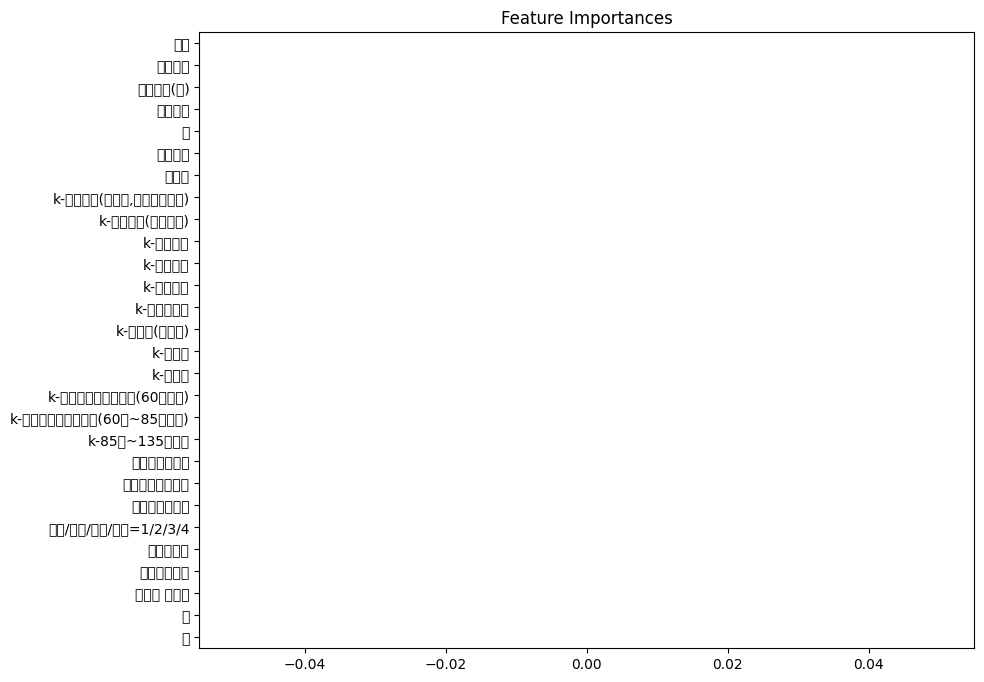

In [65]:
importances = pd.Series(model.feature_importances_, index=list(X_train.columns))
importances = importances.sort_values(ascending=False)

plt.figure(figsize=(10,8))
plt.title("Feature Importances")
sns.barplot(x=importances, y=importances.index)

In [71]:
# 학습된 모델을 저장합니다. Pickle 라이브러리를 이용하겠습니다.
with open('saved_best_model.pkl', 'wb') as f:
    pickle.dump(model, f)

In [72]:
dt_test.head(2)

,번지,아파트명,전용면적(㎡),계약년월,층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-세대타입(분양형태),k-관리방식,...,경비비관리형태,세대전기계약방법,청소비관리형태,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,target,구,동
0,3464,264,79.9700,202307,5,1987,4418,3,2,2,...,4,1,4,4,719,0,0,0,0,7
1,3443,265,108.2017,202308,10,2021,320,3,2,1,...,2,2,2,2,713,0,0,0,0,7


In [73]:
# 저장된 모델을 불러옵니다.
with open('saved_model.pkl', 'rb') as f:
    model = pickle.load(f)

In [75]:
%%time
X_test = dt_test.drop(['target'], axis=1)

# Test dataset에 대한 inference를 진행합니다.
real_test_pred = best_model.predict(X_test)

CPU times: user 13 ms, sys: 0 ns, total: 13 ms
Wall time: 3.9 ms


In [76]:
real_test_pred       

array([199386.04877029, 297918.48816001, 313010.89544237, ...,
        90636.55032496,  74619.23721673,  75812.820637  ])

In [77]:
# 앞서 예측한 예측값들을 저장합니다.
preds_df = pd.DataFrame(real_test_pred.astype(int), columns=["target"])
preds_df.to_csv('output_10.csv', index=False)

In [27]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1118822 entries, 0 to 1118821
Data columns (total 53 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   시군구                     1118822 non-null  object 
 1   번지                      1118597 non-null  object 
 2   본번                      1118747 non-null  float64
 3   부번                      1118747 non-null  float64
 4   아파트명                    1116696 non-null  object 
 5   전용면적(㎡)                 1118822 non-null  float64
 6   계약년월                    1118822 non-null  int64  
 7   계약일                     1118822 non-null  int64  
 8   층                       1118822 non-null  int64  
 9   건축년도                    1118822 non-null  int64  
 10  도로명                     1118822 non-null  object 
 11  해제사유발생일                 5983 non-null     float64
 12  등기신청일자                  1118822 non-null  object 
 13  거래유형                    1118822 non-null  object 
 14  중개

In [22]:
subway = pd.read_csv('subway_feature.csv')
bus = pd.read_csv('bus_feature.csv')

In [30]:
train['좌표X']

0          127.057210
1          127.057210
2          127.057210
3          127.057210
4          127.057210
              ...    
1118817    126.905638
1118818    126.905638
1118819    126.905638
1118820    126.905638
1118821    127.000071
Name: 좌표X, Length: 1118822, dtype: float64

In [31]:
bus['X좌표']

0        126.987752
1        126.996566
2        126.998251
3        126.987613
4        127.001744
            ...    
12579    127.139338
12580    127.140046
12581    127.123596
12582    127.125497
12583    127.127337
Name: X좌표, Length: 12584, dtype: float64

In [32]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9272 entries, 0 to 9271
Data columns (total 52 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   시군구                     9272 non-null   object 
 1   번지                      9270 non-null   object 
 2   본번                      9272 non-null   float64
 3   부번                      9272 non-null   float64
 4   아파트명                    9262 non-null   object 
 5   전용면적(㎡)                 9272 non-null   float64
 6   계약년월                    9272 non-null   int64  
 7   계약일                     9272 non-null   int64  
 8   층                       9272 non-null   int64  
 9   건축년도                    9272 non-null   int64  
 10  도로명                     9272 non-null   object 
 11  해제사유발생일                 212 non-null    float64
 12  등기신청일자                  9272 non-null   object 
 13  거래유형                    9272 non-null   object 
 14  중개사소재지                  9272 non-null   